In [1]:
import pandas as pd

from pycaret.clustering import *

In [2]:
df = pd.read_csv("AdultIncome.csv")

In [3]:
df

,age,workclass,education-num,marital-status,occupation,relationship,race,sex,hours-per-week,native-country
0,39,State-gov,13,Never-married,Adm-clerical,Not-in-family,White,Male,40,United-States
1,50,Self-emp-not-inc,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,13,United-States
2,38,Private,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,40,United-States
3,53,Private,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,40,United-States
4,28,Private,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,40,Cuba
...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,12,Married-civ-spouse,Tech-support,Wife,White,Female,38,United-States
32557,40,Private,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,40,United-States
32558,58,Private,9,Widowed,Adm-clerical,Unmarried,White,Female,40,United-States
32559,22,Private,9,Never-married,Adm-clerical,Own-child,White,Male,20,United-States


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       30725 non-null  object
 2   education-num   32561 non-null  int64 
 3   marital-status  32561 non-null  object
 4   occupation      30718 non-null  object
 5   relationship    32561 non-null  object
 6   race            32561 non-null  object
 7   sex             32561 non-null  object
 8   hours-per-week  32561 non-null  int64 
 9   native-country  31978 non-null  object
dtypes: int64(3), object(7)
memory usage: 2.5+ MB


In [5]:
df.describe()

,age,education-num,hours-per-week
count,32561.000000,32561.000000,32561.000000
mean,38.581647,10.080679,40.437456
std,13.640433,2.572720,12.347429
min,17.000000,1.000000,1.000000
25%,28.000000,9.000000,40.000000
50%,37.000000,10.000000,40.000000
75%,48.000000,12.000000,45.000000
max,90.000000,16.000000,99.000000


In [9]:
exp = setup(data=df, normalize=True, normalize_method='minmax', session_id = 123)


Setup Succesfully Completed!


,Description,Value
0,session_id,123
1,Original Data,"(32561, 10)"
2,Missing Values,True
3,Numeric Features,2
4,Categorical Features,8
5,Ordinal Features,False
6,High Cardinality Features,False
7,Transformed Data,"(32561, 104)"
8,Numeric Imputer,mean
9,Categorical Imputer,constant


In [10]:
print(exp)

(            age  hours-per-week  workclass_Federal-gov  workclass_Local-gov  \
0      0.301370        0.397959                    0.0                  0.0   
1      0.452055        0.122449                    0.0                  0.0   
2      0.287671        0.397959                    0.0                  0.0   
3      0.493151        0.397959                    0.0                  0.0   
4      0.150685        0.397959                    0.0                  0.0   
...         ...             ...                    ...                  ...   
32556  0.136986        0.377551                    0.0                  0.0   
32557  0.315068        0.397959                    0.0                  0.0   
32558  0.561644        0.397959                    0.0                  0.0   
32559  0.068493        0.193878                    0.0                  0.0   
32560  0.479452        0.397959                    0.0                  0.0   

       workclass_Never-worked  workclass_Private  

In [11]:
kmeans = create_model('kmeans', num_clusters=5)

In [12]:
print(kmeans)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=123, tol=0.0001, verbose=0)


In [13]:
kmean_results = assign_model(kmeans)
kmean_results.head()

,age,workclass,education-num,marital-status,occupation,relationship,race,sex,hours-per-week,native-country,Cluster
0,39,State-gov,13,Never-married,Adm-clerical,Not-in-family,White,Male,40,United-States,Cluster 3
1,50,Self-emp-not-inc,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,13,United-States,Cluster 0
2,38,Private,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,40,United-States,Cluster 3
3,53,Private,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,40,United-States,Cluster 1
4,28,Private,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,40,Cuba,Cluster 4


In [14]:
plot_model(kmeans)

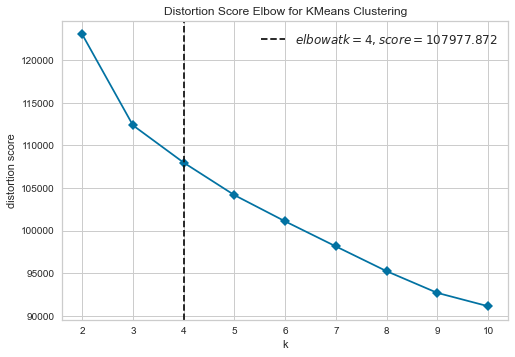

In [15]:
plot_model(kmeans, plot = 'elbow')

In [16]:
plot_model(kmeans, plot = 'distribution')

In [17]:
data_unseen = pd.read_csv("testdatacluster.csv")

In [18]:
data_unseen

,age,workclass,education-num,marital-status,occupation,relationship,race,sex,hours-per-week,native-country
0,39,State-gov,13,Never-married,Adm-clerical,Not-in-family,White,Female,40,United-States
1,50,Self-emp-no,13,Married-civ-spouse,Exec-managerial,Husband,Black,Male,13,United-States
2,38,Private,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,40,United-States


In [19]:
unseen_predictions = predict_model(kmeans, data=data_unseen)

In [20]:
unseen_predictions

,age,workclass,education-num,marital-status,occupation,relationship,race,sex,hours-per-week,native-country,Cluster
0,39,State-gov,13,Never-married,Adm-clerical,Not-in-family,White,Female,40,United-States,Cluster 2
1,50,Self-emp-no,13,Married-civ-spouse,Exec-managerial,Husband,Black,Male,13,United-States,Cluster 0
2,38,Private,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,40,United-States,Cluster 3
